In [1]:
!pip install koreanize_matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 56.0 MB/s eta 0:00:0000:0100:01


In [2]:
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam , RMSprop
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau , EarlyStopping , ModelCheckpoint , LearningRateScheduler
from tensorflow.keras.applications import ResNet50V2, VGG19, EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
import sklearn
from sklearn.model_selection import train_test_split
import cv2
import albumentations as A
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import koreanize_matplotlib
import seaborn as sns
import numpy as np
from PIL import Image
import shutil
import unicodedata
from pathlib import Path

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [57]:
pd.set_option('display.max_colwidth', 200)

def get_label(file_paths, test_size=0.05):
    paths = []
    dataset_gubuns = []
    label_gubuns = []

    for file_path in Path(file_paths).rglob("*.jpg"):
        file_path = unicodedata.normalize('NFC', str(file_path))
        paths.append(file_path)
        label = '/'.join(file_path.split('/')[-2:-1])
        label_gubuns.append(label)
        dataset_gubuns.append('train')

    data_df = pd.DataFrame({'path': paths, 'label': label_gubuns, 'dataset': dataset_gubuns})
    for label in data_df['label'].unique():
        label_df = data_df[data_df['label'] == label]
        train_df, val_df = train_test_split(label_df, test_size=test_size, random_state=42)

        # 데이터셋 구분 업데이트
        data_df.loc[val_df.index, 'dataset'] = 'val'

    return data_df


In [58]:
pd.set_option('display.max_colwidth', 200)

def get_food_filepaths(file_paths, test_size=0.03):
    paths = []
    dataset_gubuns = []
    label_gubuns = []

    for dirname, _, filenames in os.walk(file_paths):    
        for filename in filenames:
            if '.jpg' in filename:
                file_path = os.path.join(dirname, filename)
                paths.append(file_path)
                label = '/'.join(file_path.split('/')[-2:-1])
                label_gubuns.append(label)
                dataset_gubuns.append('train')

    data_df = pd.DataFrame({'path': paths, 'label': label_gubuns, 'dataset': dataset_gubuns})
    for label in data_df['label'].unique():
        label_df = data_df[data_df['label'] == label]
        train_df, val_df = train_test_split(label_df, test_size=test_size, random_state=42)
        data_df.loc[val_df.index, 'dataset'] = 'val'

    return data_df


In [59]:
file_paths = '/kaggle/input/k-food'

k_food = get_food_filepaths(file_paths)
k_label = get_label(file_paths)
k_food.shape

(142642, 3)

In [60]:
k_food[k_food['label']=='갓김치']

,path,label,dataset


In [61]:
k_food['label'] = k_label['label']
k_food[k_food['label']=='갓김치'].head()

,path,label,dataset
970,/kaggle/input/k-food/cleaned_kfood/갓김치/Img_029_0918.jpg,갓김치,train
971,/kaggle/input/k-food/cleaned_kfood/갓김치/Img_029_0140.jpg,갓김치,train
972,/kaggle/input/k-food/cleaned_kfood/갓김치/Img_029_0341.jpg,갓김치,train
973,/kaggle/input/k-food/cleaned_kfood/갓김치/Img_029_0377.jpg,갓김치,train
974,/kaggle/input/k-food/cleaned_kfood/갓김치/Img_029_0552.jpg,갓김치,train


In [62]:
k_food_valid = k_food
print(k_food_valid['dataset'].value_counts())
print(k_food_valid['label'].nunique())

dataset
train    138302
val        4340
Name: count, dtype: int64
145


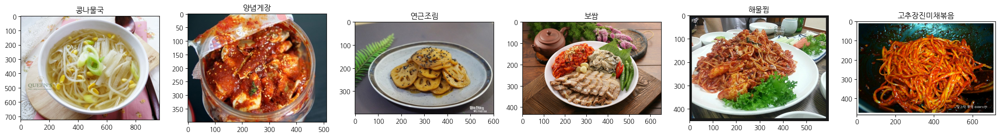

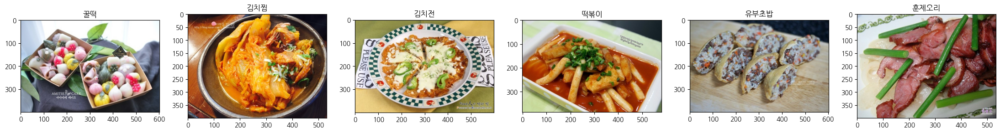

In [9]:
%matplotlib inline 


def show_grid_images(image_path_list, ncols, title=None):
    figure, axs = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i in range(ncols):
        image = cv2.cvtColor(cv2.imread(image_path_list[i]), cv2.COLOR_BGR2RGB)
        axs[i].imshow(image)
        axs[i].set_title(titles[i] if titles else '')
        axs[i].axis('on')
    plt.tight_layout()
    plt.show()


sample_df = k_food_valid.sample(6, random_state=42)
image_list = sample_df['path'].tolist()
titles = sample_df['label'].tolist()
show_grid_images(image_list, ncols=6, title=titles)

sample_df = k_food_valid.sample(6, random_state=43)
image_list = sample_df['path'].tolist()
titles = sample_df['label'].tolist()
show_grid_images(image_list, ncols=6, title=titles)

In [79]:
BATCH_SIZE = 32
IMAGE_SIZE = 300

class Food_Dataset(Sequence):
    def __init__(self, image_filenames, labels, batch_size=BATCH_SIZE, augmentor=None, shuffle=False, pre_func=None):

        self.image_filenames = image_filenames
        self.labels = labels
        self.batch_size = batch_size
        self.augmentor = augmentor
        self.pre_func = pre_func
        self.shuffle = shuffle
        if self.shuffle:
            self.on_epoch_end()
            # pass
    
    def __len__(self):
        return int(np.ceil(len(self.image_filenames)/BATCH_SIZE))

    def __getitem__(self, index):
        image_name_batch = self.image_filenames[index * self.batch_size:(index + 1) * self.batch_size]
        if self.labels is not None:
            label_batch = self.labels[index * self.batch_size:(index + 1) * self.batch_size]

        image_batch = np.zeros((image_name_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3), dtype='float32')

        for image_index in range(image_name_batch.shape[0]):

            image = cv2.imread(image_name_batch[image_index])
            if image is None:
                # print(f"이미지 오류: {image_name_batch[image_index]}")
                continue
            
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
            if self.augmentor is not None:
                image = self.augmentor(image=image)['image']
            
            if self.pre_func is not None:
                image = self.pre_func(image)
                
            image_batch[image_index] = image
        
        if self.labels is None:
            return image_batch
        else:        
            return image_batch, label_batch
    
    def on_epoch_end(self):
        if(self.shuffle):
            self.image_filenames, self.labels = sklearn.utils.shuffle(self.image_filenames, self.labels)
        else:
            pass

In [31]:
def get_train_valid(data_df):
    k_food = data_df
    train_df = k_food[k_food['dataset']=='train']
    val_df = k_food[k_food['dataset']=='val']

    tr_path = train_df['path'].values
    tr_label = pd.factorize(train_df['label'])[0]
    tr_label = to_categorical(tr_label)
    
    val_path = val_df['path'].values
    val_label = pd.factorize(val_df['label'])[0]
    val_label = to_categorical(val_label) 

    print('학습용 shape:', tr_path.shape, '검증용 shape:', val_path.shape, '학습용 label:', tr_label.shape, '검증용 label:', val_label.shape)
    return tr_path, tr_label, val_path, val_label


In [32]:
def create_model(model_type='xception', in_shape=(300, 300, 3), n_classes=145, freeze_layers=50, verbose=False):
    input_tensor = Input(shape=in_shape)
    if model_type == 'resnet50v2':
        base_model = tf.keras.applications.ResNet50V2(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'xception':
        base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'efficientnetb0':
        base_model = tf.keras.applications.EfficientNetB0(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'efficientnetb1':
        base_model = tf.keras.applications.EfficientNetB1(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'efficientnetb3':
        base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights='imagenet', input_tensor=input_tensor)

    # freeze
    for layer in base_model.layers[:-freeze_layers]:
        layer.trainable = False
        
    # Unfreeze remaining layers but keep BatchNormalization layers frozen -> 케라스 공식문서 팁
    # https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/
    for layer in base_model.layers[-freeze_layers:]:
        if not isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = True
        else:
            layer.trainable = False

    feature_extractor = Model(inputs=input_tensor, outputs=base_model.output)

    x = base_model.output  
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)    
    
    preds = Dense(units=n_classes, activation='softmax')(x)
    model = Model(inputs=input_tensor, outputs=preds)
    
    if verbose:
        model.summary()
        
    return model, feature_extractor

In [33]:
def lrfn(epoch): 
    LR_START = 1e-5
    LR_MAX = 1e-4
    LR_RAMPUP_EPOCHS = 2
    LR_SUSTAIN_EPOCHS = 1
    LR_STEP_DECAY = 0.75
    
    def calc_fn(epoch):
        if epoch < LR_RAMPUP_EPOCHS:
            lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
        elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
            lr = LR_MAX
        else:
            lr = LR_MAX * LR_STEP_DECAY**((epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS)//2)
        return lr
    return calc_fn(epoch)


In [34]:
def train_model(model_type, train_df, initial_lr=0.001, augmentor=None, input_pre_func=None):
    tr_path, tr_label, val_path, val_label = get_train_valid(train_df)
    print('학습용 shape:', tr_path.shape, '검증용 shape:', val_path.shape, '학습용 label:', tr_label.shape, '검증용 label:', val_label.shape)
    
    tr_ds = Food_Dataset(tr_path, tr_label, batch_size=BATCH_SIZE, augmentor=augmentor, shuffle=True, pre_func=input_pre_func)
    val_ds = Food_Dataset(val_path, val_label, batch_size=BATCH_SIZE, augmentor=None, shuffle=False, pre_func=input_pre_func)


    # strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"])
    # with strategy.scope():
    print('#######', model_type, ' 생성 및 학습 수행 ########')
    model, feature_extractor = create_model(model_type=model_type)
    model.compile(optimizer=Adam(learning_rate=initial_lr), loss='categorical_crossentropy', metrics=['accuracy'])
    
    lr_cb = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=1)
    model_path = '/kaggle/working/{epoch:02d}-{val_loss:.4f}.keras'
    checkpoint = ModelCheckpoint(filepath=model_path, monitor='val_loss', verbose=0, save_best_only=True)
        
    history = model.fit(tr_ds, epochs=N_EPOCHS, validation_data=val_ds, callbacks=([lr_cb, checkpoint]), verbose=1)
    return model, feature_extractor, history

In [35]:
augmentor_heavy_01 = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.2),
    A.CenterCrop(height=90, width=90, p=0.2),
    A.OneOf(
        [A.CoarseDropout(p=1, max_holes=26), 
         A.CLAHE(p=1),
         # A.Blur(blur_limit=(10, 15), p=1) # 음식 사진을 찍을 때 초점이 안 맞게 찍지 않기 때문에 제외
        ], p=0.3)
])


In [28]:
def show_grid_a_images(image_path_list, augmentor=None, ncols=4, title=None):
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        image = cv2.cvtColor(cv2.imread(image_path_list[i]), cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (300, 300))
        if augmentor is not None:
            image = augmentor(image=image)['image']
        axs[i].imshow(image)
        axs[i].axis('on')
        axs[i].set_title(title) 

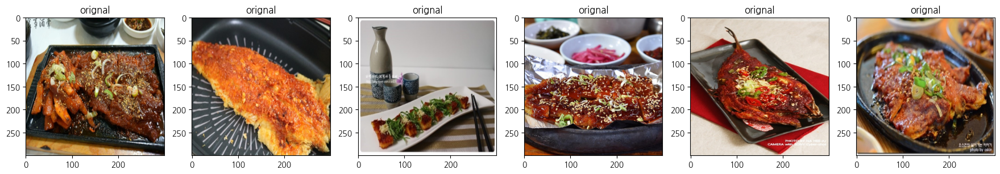

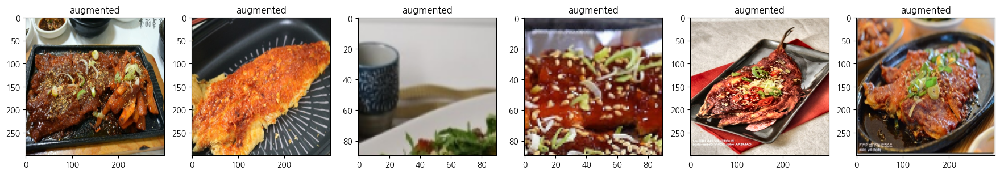

In [17]:
breed_image_list_01 = k_food_valid['path'].iloc[:6].tolist()       
show_grid_a_images(breed_image_list_01, augmentor=None, ncols=6, title='orignal')
show_grid_a_images(breed_image_list_01, augmentor=augmentor_heavy_01, ncols=6, title='augmented')

In [38]:
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_preprocess_input

N_EPOCHS = 15
model1, feature_extractor1, history1 = train_model(model_type='efficientnetb3', train_df=k_food_valid, initial_lr=0.001, 
                                                     augmentor=None, input_pre_func=eff_preprocess_input)


학습용 shape: (138302,) 검증용 shape: (4340,) 학습용 label: (138302, 145) 검증용 label: (4340, 145)
학습용 shape: (138302,) 검증용 shape: (4340,) 학습용 label: (138302, 145) 검증용 label: (4340, 145)
####### efficientnetb3  생성 및 학습 수행 ########

Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/15


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731495439.046683     119 service.cc:145] XLA service 0x78ecbc004040 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731495439.046747     119 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   1/4322 ━━━━━━━━━━━━━━━━━━━━ 78:16:29 65s/step - accuracy: 0.0000e+00 - loss: 5.0944

I0000 00:00:1731495482.716125     119 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4322/4322 ━━━━━━━━━━━━━━━━━━━━ 1969s 441ms/step - accuracy: 0.0699 - loss: 4.5682 - val_accuracy: 0.4401 - val_loss: 2.4004 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 5.5e-05.
Epoch 2/15
4322/4322 ━━━━━━━━━━━━━━━━━━━━ 938s 217ms/step - accuracy: 0.4471 - loss: 2.1737 - val_accuracy: 0.7113 - val_loss: 1.0145 - learning_rate: 5.5000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.0001.
Epoch 3/15
4322/4322 ━━━━━━━━━━━━━━━━━━━━ 907s 210ms/step - accuracy: 0.6622 - loss: 1.2123 - val_accuracy: 0.7613 - val_loss: 0.8074 - learning_rate: 1.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0001.
Epoch 4/15
4322/4322 ━━━━━━━━━━━━━━━━━━━━ 958s 221ms/step - accuracy: 0.7559 - loss: 0.8449 - val_accuracy: 0.7908 - val_loss: 0.7286 - learning_rate: 1.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0001.
Epoch 5/15
4322/4322 ━━━━━━━━━━━━━━━━━━━━ 908s 210ms/step - accuracy: 0.8041 - loss: 0.6600 - val_acc

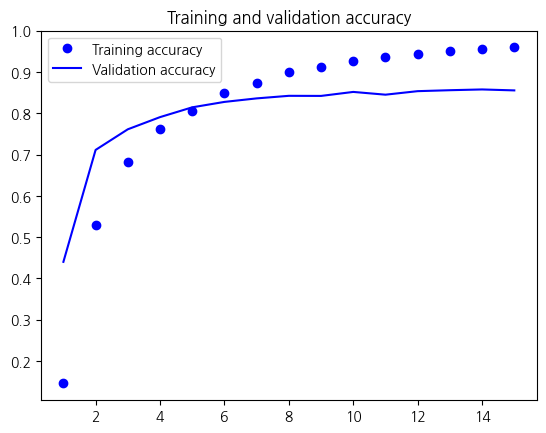

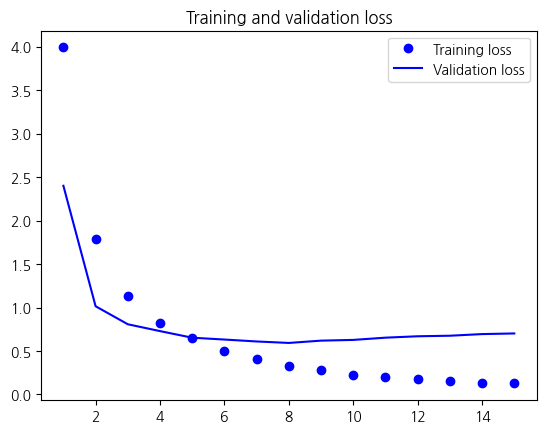

In [41]:
accuracy = history1.history["accuracy"]
loss = history1.history["loss"]

val_accuracy = history1.history["val_accuracy"]
val_loss = history1.history["val_loss"]

total_len = range(1, len(accuracy) + 1)


plt.plot(total_len, accuracy, "bo", label="Training accuracy")
plt.plot(total_len, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()

plt.plot(total_len, loss, "bo", label="Training loss")
plt.plot(total_len, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [104]:
model1.save('effi_batch_fix.h5')
# model2 = load_model('/kaggle/working/08-0.5925.keras')

In [86]:
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_preprocess_input
preprocessing_func = eff_preprocess_input

In [88]:
val_df = k_food_valid[k_food_valid['dataset']=='val']

val_path = val_df['path'].values
val_label = pd.factorize(val_df['label'])[0]
val_label = to_categorical(val_label) 


val_ds = Food_Dataset(val_path, val_label, batch_size=BATCH_SIZE, augmentor=None, shuffle=False, pre_func=preprocessing_func)

In [89]:
true_labels = np.argmax(val_label, axis=1)
true_labels

array([  0,   0,   0, ..., 144, 144, 144])

In [90]:
predictions = model2.predict(val_ds)

predicted_labels = np.argmax(predictions, axis=1)
predicted_labels

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


136/136 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step


array([  0,   0,   0, ..., 144, 144, 144])

In [91]:
from sklearn.metrics import classification_report

class_names = sorted(k_food_valid['label'].unique())
report_dict = classification_report(true_labels, predicted_labels, target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

# F1-score가 높은 상위 5개의 클래스
high_f1_classes = report_df.sort_values(by='f1-score', ascending=False).head(5)
print("성능이 높은 클래스들:")
print(high_f1_classes[['precision', 'recall', 'f1-score']])


성능이 높은 클래스들:
       precision    recall  f1-score
유부초밥    0.967742  1.000000  0.983607
고등어구이   0.966667  1.000000  0.983051
콩나물국    1.000000  0.937500  0.967742
고등어조림   0.966667  0.966667  0.966667
양념치킨    0.966667  0.966667  0.966667


In [92]:
report_dict = classification_report(true_labels, predicted_labels, target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

# F1-score가 낮은 상위 5개의 클래스
low_f1_classes = report_df.sort_values(by='f1-score').head(5)
print("성능이 낮은 클래스들:")
print(low_f1_classes[['precision', 'recall', 'f1-score']])


성능이 낮은 클래스들:
        precision    recall  f1-score
시금치나물    0.714286  0.333333  0.454545
닭볶음탕     0.608696  0.466667  0.528302
떡국_만두국   0.571429  0.533333  0.551724
김치찜      0.446429  0.781250  0.568182
물냉면      0.545455  0.600000  0.571429


In [93]:
pd.set_option('display.max_colwidth', 200)

def get_label(file_paths, test_size=0.05):
    paths = []
    dataset_gubuns = []
    label_gubuns = []

    for file_path in Path(file_paths).rglob("*.png"):
        file_path = unicodedata.normalize('NFC', str(file_path))
        paths.append(file_path)

        label = '/'.join(file_path.split('/')[-2:-1])  # 상위 두 폴더 이름을 레이블로 사용
        label_gubuns.append(label)
        dataset_gubuns.append('train')

    data_df = pd.DataFrame({'path': paths, 'label': label_gubuns, 'dataset': dataset_gubuns})
    return data_df


In [94]:
pd.set_option('display.max_colwidth', 200)

def get_food_pred(file_paths, test_size=0.05):
    paths = []
    dataset_gubuns = []
    label_gubuns = []

    for dirname, _, filenames in os.walk(file_paths):    
        for filename in filenames:
            if '.png' in filename:
                file_path = os.path.join(dirname, filename)
                paths.append(file_path)

                label = '/'.join(file_path.split('/')[-3:-1]) 
                label_gubuns.append(label)
                dataset_gubuns.append('train')

    data_df = pd.DataFrame({'path': paths, 'label': label_gubuns, 'dataset': dataset_gubuns})
    for label in data_df['label'].unique():
        label_df = data_df[data_df['label'] == label]
        train_df, val_df = train_test_split(label_df, test_size=test_size, random_state=42)
        data_df.loc[val_df.index, 'dataset'] = 'val'

    return data_df


In [95]:
file_paths = '/kaggle/input/kfood-pred'

k_food_pred = get_food_pred(file_paths)
k_label_pred = get_label(file_paths)
k_food_pred.shape

(33, 3)

In [96]:
k_label_pred.head(2)

,path,label,dataset
0,/kaggle/input/kfood-pred/food_pred/제육볶음/스크린샷 2024-11-11 오후 10.26.51.png,제육볶음,train
1,/kaggle/input/kfood-pred/food_pred/제육볶음/스크린샷 2024-11-11 오후 10.27.05.png,제육볶음,train


In [97]:
k_food_pred['label'] = k_label_pred['label']

In [98]:
pred_df = k_food_pred

pred_path = pred_df['path'].values
# pred_label = pd.factorize(pred_df['label'])[0]
# pred_label = to_categorical(pred_label) 

pred_ds = Food_Dataset(pred_path, None, batch_size=BATCH_SIZE, augmentor=None, shuffle=False, pre_func=preprocessing_func)

In [99]:
train_df = k_food

tr_label, unique_labels = pd.factorize(train_df['label'])  # 인코딩된 라벨과 고유 라벨 목록 반환
tr_label = to_categorical(tr_label) 

In [100]:
predictions = model2.predict(pred_ds)
predicted_labels = np.argmax(predictions, axis=1)

predicted_labels_list = [unique_labels[label] for label in predicted_labels]

k_food_pred['pred'] = predicted_labels_list

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 13s 7s/step


In [101]:
accuracy = (k_food_pred['label'] == k_food_pred['pred']).mean()
print(f'정확도: {accuracy * 100:.2f}%') # 72.73

정확도: 100.00%


In [102]:
k_food_pred.drop(['dataset'], axis=1, inplace=True)
k_food_pred

,path,label,pred
0,/kaggle/input/kfood-pred/food_pred/제육볶음/스크린샷 2024-11-11 오후 10.26.51.png,제육볶음,제육볶음
1,/kaggle/input/kfood-pred/food_pred/제육볶음/스크린샷 2024-11-11 오후 10.27.05.png,제육볶음,제육볶음
2,/kaggle/input/kfood-pred/food_pred/제육볶음/스크린샷 2024-11-11 오후 10.26.44.png,제육볶음,제육볶음
3,/kaggle/input/kfood-pred/food_pred/조기구이/스크린샷 2024-11-11 오후 10.19.23.png,조기구이,조기구이
4,/kaggle/input/kfood-pred/food_pred/조기구이/스크린샷 2024-11-11 오후 10.19.33.png,조기구이,조기구이
5,/kaggle/input/kfood-pred/food_pred/조기구이/스크린샷 2024-11-11 오후 10.19.17.png,조기구이,조기구이
6,/kaggle/input/kfood-pred/food_pred/콩나물국/스크린샷 2024-11-11 오후 10.25.07.png,콩나물국,콩나물국
7,/kaggle/input/kfood-pred/food_pred/콩나물국/스크린샷 2024-11-11 오후 10.25.13.png,콩나물국,콩나물국
8,/kaggle/input/kfood-pred/food_pred/콩나물국/스크린샷 2024-11-11 오후 10.24.57.png,콩나물국,콩나물국
9,/kaggle/input/kfood-pred/food_pred/떡볶이/스크린샷 2024-11-11 오후 10.19.00.png,떡볶이,떡볶이


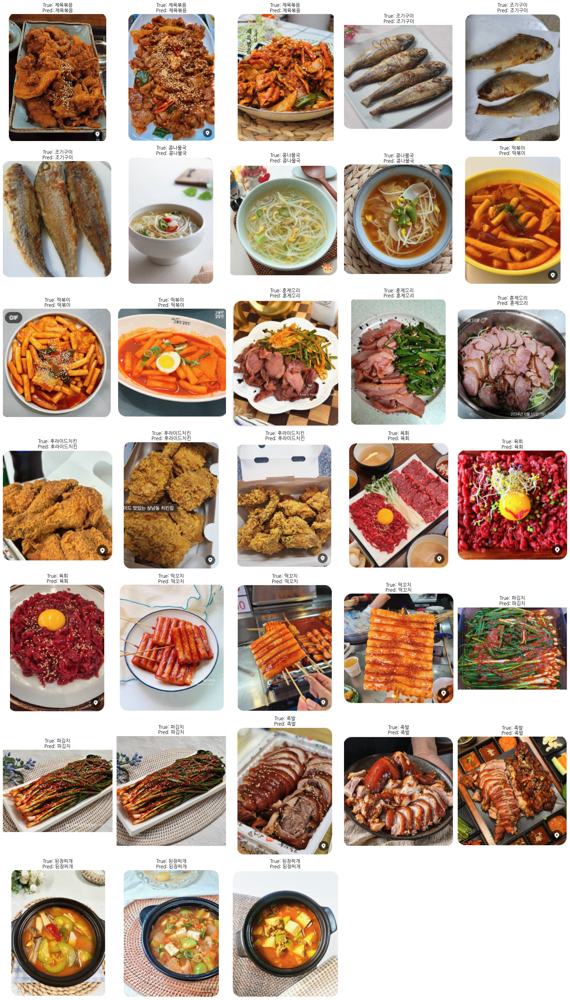

In [103]:
def visualize_predictions(df, num_images):
    sample_df = df.iloc[:min(num_images, len(df))]
    rows = (num_images + 4) // 5
    fig, axes = plt.subplots(rows, 5, figsize=(20, 5 * rows))

    if rows > 1:
        axes = axes.ravel()

    for i, (index, row) in enumerate(sample_df.iterrows()):
        img_path = row['path']
        true_label = row['label']
        predicted_label = row['pred']

        image = cv2.imread(img_path)
        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            axes[i].imshow(image)
            axes[i].axis('off')
            axes[i].set_title(f"True: {true_label}\nPred: {predicted_label}")

    # 만약 이미지 개수가 행*열보다 적다면 남은 축을 숨깁니다.
    for j in range(i + 1, rows * 5):
        axes[j].axis('off')
 
    plt.tight_layout()
    plt.show()
    
# 예시 호출
visualize_predictions(k_food_pred, num_images=33)